In [4]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from IPython.display import HTML

In [5]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Activation, Flatten, BatchNormalization, Conv2D, MaxPool2D,Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications import imagenet_utils
from sklearn.metrics import confusion_matrix
from tensorflow.keras.optimizers import Adam
import itertools
import os
import shutil
import random
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow.keras.models import Sequential

import cv2

In [1]:
import splitfolders


input_folder = r"C:\Users\User\Desktop\Models(FYP)\mobileNet_Try\copy" 
output_folder = r"C:\Users\User\Desktop\Models(FYP)\mobileNet_Try\dataset"


splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.8, 0.1, 0.1))

Copying files: 1235 files [00:15, 81.10 files/s] 


In [6]:
train_ds = 'dataset/train'
valid_ds = 'dataset/val'
test_ds = 'dataset/test'

In [7]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input).flow_from_directory(
    directory=train_ds, target_size=(224,224), batch_size=10)
valid_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input).flow_from_directory(
    directory=valid_ds, target_size=(224,224), batch_size=10)
test_batches = ImageDataGenerator(preprocessing_function=tf.keras.applications.mobilenet.preprocess_input).flow_from_directory(
    directory=test_ds, target_size=(224,224), batch_size=10, shuffle=False)

Found 986 images belonging to 6 classes.
Found 120 images belonging to 6 classes.
Found 129 images belonging to 6 classes.


In [7]:
mobile_net_v2 = tf.keras.applications.MobileNetV2()

In [8]:
mobile_net_v2.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[

 block_3_expand_relu (ReLU)  (None, 56, 56, 144)          0         ['block_3_expand_BN[0][0]']   
                                                                                                  
 block_3_pad (ZeroPadding2D  (None, 57, 57, 144)          0         ['block_3_expand_relu[0][0]'] 
 )                                                                                                
                                                                                                  
 block_3_depthwise (Depthwi  (None, 28, 28, 144)          1296      ['block_3_pad[0][0]']         
 seConv2D)                                                                                        
                                                                                                  
 block_3_depthwise_BN (Batc  (None, 28, 28, 144)          576       ['block_3_depthwise[0][0]']   
 hNormalization)                                                                                  
          

 block_6_depthwise_BN (Batc  (None, 14, 14, 192)          768       ['block_6_depthwise[0][0]']   
 hNormalization)                                                                                  
                                                                                                  
 block_6_depthwise_relu (Re  (None, 14, 14, 192)          0         ['block_6_depthwise_BN[0][0]']
 LU)                                                                                              
                                                                                                  
 block_6_project (Conv2D)    (None, 14, 14, 64)           12288     ['block_6_depthwise_relu[0][0]
                                                                    ']                            
                                                                                                  
 block_6_project_BN (BatchN  (None, 14, 14, 64)           256       ['block_6_project[0][0]']     
 ormalizat

                                                                                                  
 block_9_add (Add)           (None, 14, 14, 64)           0         ['block_8_add[0][0]',         
                                                                     'block_9_project_BN[0][0]']  
                                                                                                  
 block_10_expand (Conv2D)    (None, 14, 14, 384)          24576     ['block_9_add[0][0]']         
                                                                                                  
 block_10_expand_BN (BatchN  (None, 14, 14, 384)          1536      ['block_10_expand[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 block_10_expand_relu (ReLU  (None, 14, 14, 384)          0         ['block_10_expand_BN[0][0]']  
 )        

                                                                                                  
 block_13_expand_relu (ReLU  (None, 14, 14, 576)          0         ['block_13_expand_BN[0][0]']  
 )                                                                                                
                                                                                                  
 block_13_pad (ZeroPadding2  (None, 15, 15, 576)          0         ['block_13_expand_relu[0][0]']
 D)                                                                                               
                                                                                                  
 block_13_depthwise (Depthw  (None, 7, 7, 576)            5184      ['block_13_pad[0][0]']        
 iseConv2D)                                                                                       
                                                                                                  
 block_13_

 iseConv2D)                                                                                       
                                                                                                  
 block_16_depthwise_BN (Bat  (None, 7, 7, 960)            3840      ['block_16_depthwise[0][0]']  
 chNormalization)                                                                                 
                                                                                                  
 block_16_depthwise_relu (R  (None, 7, 7, 960)            0         ['block_16_depthwise_BN[0][0]'
 eLU)                                                               ]                             
                                                                                                  
 block_16_project (Conv2D)   (None, 7, 7, 320)            307200    ['block_16_depthwise_relu[0][0
                                                                    ]']                           
          

In [9]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
mobile_net_v2 = MobileNetV2(weights='imagenet', include_top=True)


new_model = tf.keras.Model(inputs=mobile_net_v2.input, outputs=mobile_net_v2.layers[-2].output)


new_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']        

 block_3_expand_relu (ReLU)  (None, 56, 56, 144)          0         ['block_3_expand_BN[0][0]']   
                                                                                                  
 block_3_pad (ZeroPadding2D  (None, 57, 57, 144)          0         ['block_3_expand_relu[0][0]'] 
 )                                                                                                
                                                                                                  
 block_3_depthwise (Depthwi  (None, 28, 28, 144)          1296      ['block_3_pad[0][0]']         
 seConv2D)                                                                                        
                                                                                                  
 block_3_depthwise_BN (Batc  (None, 28, 28, 144)          576       ['block_3_depthwise[0][0]']   
 hNormalization)                                                                                  
          

 block_6_depthwise_BN (Batc  (None, 14, 14, 192)          768       ['block_6_depthwise[0][0]']   
 hNormalization)                                                                                  
                                                                                                  
 block_6_depthwise_relu (Re  (None, 14, 14, 192)          0         ['block_6_depthwise_BN[0][0]']
 LU)                                                                                              
                                                                                                  
 block_6_project (Conv2D)    (None, 14, 14, 64)           12288     ['block_6_depthwise_relu[0][0]
                                                                    ']                            
                                                                                                  
 block_6_project_BN (BatchN  (None, 14, 14, 64)           256       ['block_6_project[0][0]']     
 ormalizat

                                                                                                  
 block_9_add (Add)           (None, 14, 14, 64)           0         ['block_8_add[0][0]',         
                                                                     'block_9_project_BN[0][0]']  
                                                                                                  
 block_10_expand (Conv2D)    (None, 14, 14, 384)          24576     ['block_9_add[0][0]']         
                                                                                                  
 block_10_expand_BN (BatchN  (None, 14, 14, 384)          1536      ['block_10_expand[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 block_10_expand_relu (ReLU  (None, 14, 14, 384)          0         ['block_10_expand_BN[0][0]']  
 )        

                                                                                                  
 block_13_expand_relu (ReLU  (None, 14, 14, 576)          0         ['block_13_expand_BN[0][0]']  
 )                                                                                                
                                                                                                  
 block_13_pad (ZeroPadding2  (None, 15, 15, 576)          0         ['block_13_expand_relu[0][0]']
 D)                                                                                               
                                                                                                  
 block_13_depthwise (Depthw  (None, 7, 7, 576)            5184      ['block_13_pad[0][0]']        
 iseConv2D)                                                                                       
                                                                                                  
 block_13_

 iseConv2D)                                                                                       
                                                                                                  
 block_16_depthwise_BN (Bat  (None, 7, 7, 960)            3840      ['block_16_depthwise[0][0]']  
 chNormalization)                                                                                 
                                                                                                  
 block_16_depthwise_relu (R  (None, 7, 7, 960)            0         ['block_16_depthwise_BN[0][0]'
 eLU)                                                               ]                             
                                                                                                  
 block_16_project (Conv2D)   (None, 7, 7, 320)            307200    ['block_16_depthwise_relu[0][0
                                                                    ]']                           
          

In [11]:
num_classes = 6
new_last_layer = tf.keras.layers.Dense(num_classes, activation='softmax')(new_model.output)

# Create the final model with the new last layer
final_model = tf.keras.Model(inputs=new_model.input, outputs=new_last_layer)

# Print the summary of the final model
final_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']      

 block_3_expand_relu (ReLU)  (None, 56, 56, 144)          0         ['block_3_expand_BN[0][0]']   
                                                                                                  
 block_3_pad (ZeroPadding2D  (None, 57, 57, 144)          0         ['block_3_expand_relu[0][0]'] 
 )                                                                                                
                                                                                                  
 block_3_depthwise (Depthwi  (None, 28, 28, 144)          1296      ['block_3_pad[0][0]']         
 seConv2D)                                                                                        
                                                                                                  
 block_3_depthwise_BN (Batc  (None, 28, 28, 144)          576       ['block_3_depthwise[0][0]']   
 hNormalization)                                                                                  
          

 block_6_depthwise_BN (Batc  (None, 14, 14, 192)          768       ['block_6_depthwise[0][0]']   
 hNormalization)                                                                                  
                                                                                                  
 block_6_depthwise_relu (Re  (None, 14, 14, 192)          0         ['block_6_depthwise_BN[0][0]']
 LU)                                                                                              
                                                                                                  
 block_6_project (Conv2D)    (None, 14, 14, 64)           12288     ['block_6_depthwise_relu[0][0]
                                                                    ']                            
                                                                                                  
 block_6_project_BN (BatchN  (None, 14, 14, 64)           256       ['block_6_project[0][0]']     
 ormalizat

                                                                                                  
 block_9_add (Add)           (None, 14, 14, 64)           0         ['block_8_add[0][0]',         
                                                                     'block_9_project_BN[0][0]']  
                                                                                                  
 block_10_expand (Conv2D)    (None, 14, 14, 384)          24576     ['block_9_add[0][0]']         
                                                                                                  
 block_10_expand_BN (BatchN  (None, 14, 14, 384)          1536      ['block_10_expand[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 block_10_expand_relu (ReLU  (None, 14, 14, 384)          0         ['block_10_expand_BN[0][0]']  
 )        

                                                                                                  
 block_13_expand_relu (ReLU  (None, 14, 14, 576)          0         ['block_13_expand_BN[0][0]']  
 )                                                                                                
                                                                                                  
 block_13_pad (ZeroPadding2  (None, 15, 15, 576)          0         ['block_13_expand_relu[0][0]']
 D)                                                                                               
                                                                                                  
 block_13_depthwise (Depthw  (None, 7, 7, 576)            5184      ['block_13_pad[0][0]']        
 iseConv2D)                                                                                       
                                                                                                  
 block_13_

 iseConv2D)                                                                                       
                                                                                                  
 block_16_depthwise_BN (Bat  (None, 7, 7, 960)            3840      ['block_16_depthwise[0][0]']  
 chNormalization)                                                                                 
                                                                                                  
 block_16_depthwise_relu (R  (None, 7, 7, 960)            0         ['block_16_depthwise_BN[0][0]'
 eLU)                                                               ]                             
                                                                                                  
 block_16_project (Conv2D)   (None, 7, 7, 320)            307200    ['block_16_depthwise_relu[0][0
                                                                    ]']                           
          

In [11]:

from tensorflow.keras.optimizers import Adam
final_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [12]:
history=final_model.fit(x=train_batches,
            steps_per_epoch=len(train_batches),
            validation_data=valid_batches,
            validation_steps=len(valid_batches),
            epochs=10,
            verbose=2
)

Epoch 1/10
99/99 - 182s - loss: 0.3888 - accuracy: 0.8966 - val_loss: 2.2341 - val_accuracy: 0.3833 - 182s/epoch - 2s/step
Epoch 2/10
99/99 - 118s - loss: 0.0829 - accuracy: 0.9797 - val_loss: 1.5192 - val_accuracy: 0.5000 - 118s/epoch - 1s/step
Epoch 3/10
99/99 - 137s - loss: 0.0311 - accuracy: 0.9959 - val_loss: 0.9715 - val_accuracy: 0.7167 - 137s/epoch - 1s/step
Epoch 4/10
99/99 - 131s - loss: 0.0157 - accuracy: 0.9970 - val_loss: 0.4341 - val_accuracy: 0.8167 - 131s/epoch - 1s/step
Epoch 5/10
99/99 - 126s - loss: 0.0175 - accuracy: 0.9939 - val_loss: 0.5220 - val_accuracy: 0.8167 - 126s/epoch - 1s/step
Epoch 6/10
99/99 - 141s - loss: 0.0378 - accuracy: 0.9919 - val_loss: 0.3184 - val_accuracy: 0.8833 - 141s/epoch - 1s/step
Epoch 7/10
99/99 - 125s - loss: 0.0232 - accuracy: 0.9959 - val_loss: 0.1431 - val_accuracy: 0.9500 - 125s/epoch - 1s/step
Epoch 8/10
99/99 - 151s - loss: 0.0125 - accuracy: 0.9980 - val_loss: 0.1396 - val_accuracy: 0.9500 - 151s/epoch - 2s/step
Epoch 9/10
99/99

In [15]:
scores = final_model.evaluate(test_batches)

13/13 [==============================] - 5s 419ms/step - loss: 0.0028 - accuracy: 1.0000


In [16]:
final_accuracy = history.history['accuracy'][-1]
print(f"Final Accuracy: {final_accuracy * 100:.2f}%")


Final Accuracy: 99.19%


In [18]:
scores = final_model.evaluate(train_batches)

99/99 [==============================] - 34s 345ms/step - loss: 0.0050 - accuracy: 1.0000


In [22]:
# Assuming you have preprocessed your test data into 'test_batches' (similar to how you preprocessed your train and validation data)
# 'test_batches' should be an instance of ImageDataGenerator.flow_from_directory()

# Get predictions from the model
predictions = final_model.predict(test_batches)

# Convert predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)

# Get actual labels from the 'test_batches' object
actual_labels = test_batches.classes

# Get class names from the 'test_batches' object
class_names = list(test_batches.class_indices.keys())

# Initialize a variable to keep track of correct predictions
correct_predictions = 0

# Iterate through the test batch and print image filename, predicted class name, actual class name, and accuracy
for i in range(len(test_batches.filenames)):
    image_filename = test_batches.filenames[i]
    predicted_class_name = class_names[predicted_labels[i]]
    actual_class_name = class_names[actual_labels[i]]
    
    # Check if the prediction is correct
    is_correct = predicted_class_name == actual_class_name
    
    if is_correct:
        correct_predictions += 1
    
    # Calculate accuracy for the current image
    accuracy = correct_predictions / (i + 1)
    
    print(f"Image: {image_filename} | Predicted: {predicted_class_name} | Actual: {actual_class_name} | Accuracy: {accuracy:.2%}")


13/13 [==============================] - 5s 379ms/step
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.29 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 100.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 100.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.40 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 100.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.00 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 100.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.01 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 100.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.14 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 100.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.24 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 100.00%
Image: Corynespora\Wh

In [23]:
# Assuming you have preprocessed your test data into 'test_batches' (similar to how you preprocessed your train and validation data)
# 'test_batches' should be an instance of ImageDataGenerator.flow_from_directory()

# Get predictions from the model
predictions = final_model.predict(test_batches)

# Convert predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)

# Get actual labels from the 'test_batches' object
actual_labels = test_batches.classes

# Get class names from the 'test_batches' object
class_names = list(test_batches.class_indices.keys())

# Initialize a variable to keep track of correct predictions
correct_predictions = 0

# Iterate through the test batch and print image filename, predicted class name, actual class name, and accuracy
for i in range(len(test_batches.filenames)):
    image_filename = test_batches.filenames[i]
    predicted_class_name = class_names[predicted_labels[i]]
    actual_class_name = class_names[actual_labels[i]]
    
    # Calculate accuracy for the current image
    accuracy = correct_predictions / (i + 1)
    
    print(f"Image: {image_filename} | Predicted: {predicted_class_name} | Actual: {actual_class_name} | Accuracy: {accuracy:.2%}")


13/13 [==============================] - 5s 370ms/step
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.29 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 0.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 0.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.40 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 0.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.00 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 0.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.01 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 0.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.14 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 0.00%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.24 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Accuracy: 0.00%
Image: Corynespora\WhatsApp Image 2

In [24]:
# Assuming you have preprocessed your test data into 'test_batches' (similar to how you preprocessed your train and validation data)
# 'test_batches' should be an instance of ImageDataGenerator.flow_from_directory()

# Get predictions from the model
predictions = final_model.predict(test_batches)

# Convert predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)

# Get actual labels from the 'test_batches' object
actual_labels = test_batches.classes

# Get class names from the 'test_batches' object
class_names = list(test_batches.class_indices.keys())

# Iterate through the test batch and print image filename, predicted class name, actual class name, and confidence percentage
for i in range(len(test_batches.filenames)):
    image_filename = test_batches.filenames[i]
    predicted_class_name = class_names[predicted_labels[i]]
    actual_class_name = class_names[actual_labels[i]]
    
    # Get the confidence percentage for the predicted class
    confidence_percentage = predictions[i][predicted_labels[i]] * 100.0
    
    print(f"Image: {image_filename} | Predicted: {predicted_class_name} | Actual: {actual_class_name} | Confidence: {confidence_percentage:.2f}%")


13/13 [==============================] - 5s 374ms/step
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.29 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.97%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.98%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.40 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.42%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.00 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.56%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.01 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.98%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.14 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.31%
Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.24 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.89%
Image: Corynes

13/13 [==============================] - 5s 367ms/step


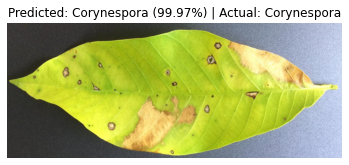

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.29 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.97%


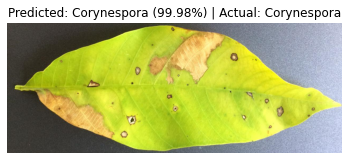

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.98%


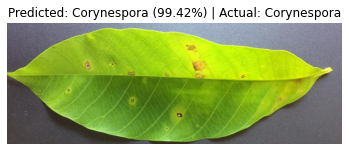

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.32.40 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.42%


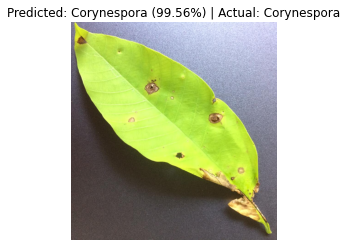

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.00 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.56%


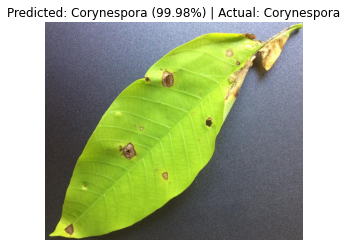

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.01 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.98%


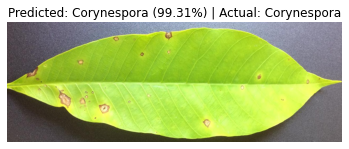

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.14 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.31%


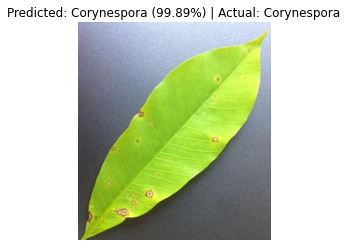

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.24 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.89%


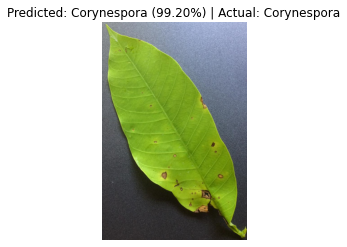

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.34.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.20%


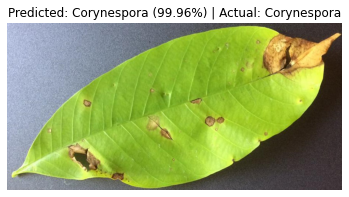

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.37.34 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.96%


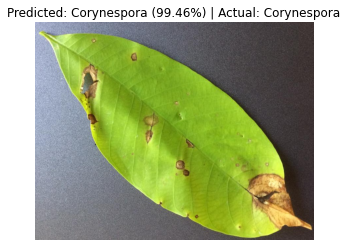

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.37.35 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.46%


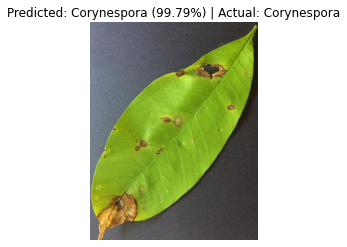

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.37.50 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.79%


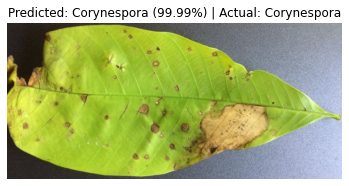

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.38.13 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.99%


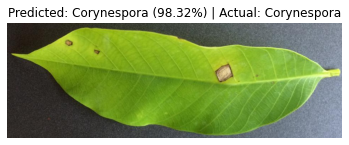

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.38.22 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 98.32%


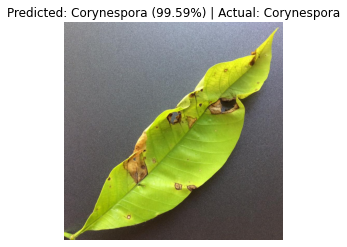

Image: Corynespora\WhatsApp Image 2023-04-12 at 10.40.30 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.59%


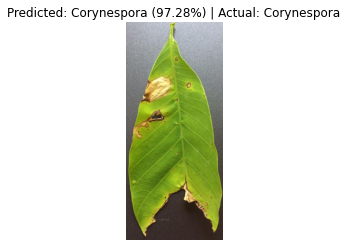

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.10.10 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 97.28%


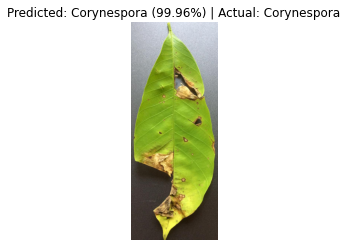

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.10.59 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.96%


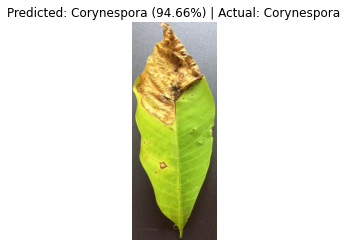

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.12.17 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 94.66%


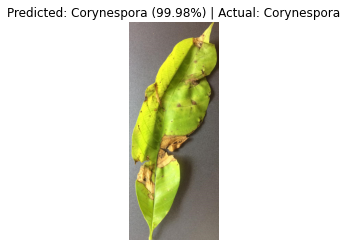

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.13.06 AM.jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.98%


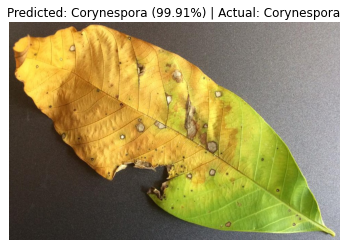

Image: Corynespora\WhatsApp Image 2023-04-12 at 11.13.26 AM (1).jpeg | Predicted: Corynespora | Actual: Corynespora | Confidence: 99.91%


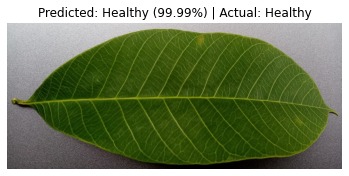

Image: Healthy\IMG_20230323_113856.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.99%


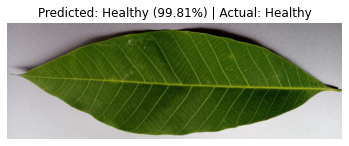

Image: Healthy\IMG_20230323_114110.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.81%


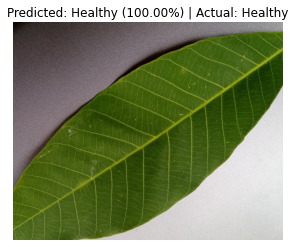

Image: Healthy\IMG_20230323_114116.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


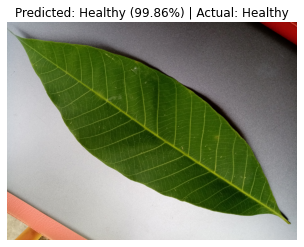

Image: Healthy\IMG_20230323_114125.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.86%


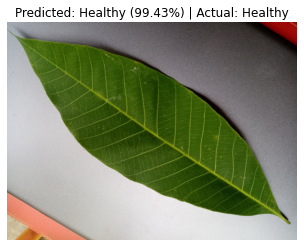

Image: Healthy\IMG_20230323_114126.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.43%


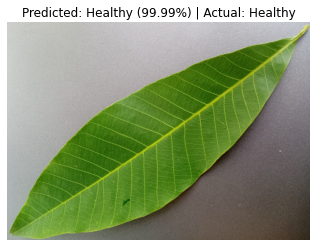

Image: Healthy\IMG_20230323_115040.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.99%


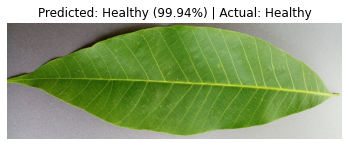

Image: Healthy\IMG_20230323_115233.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.94%


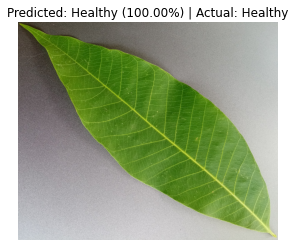

Image: Healthy\IMG_20230323_115253.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


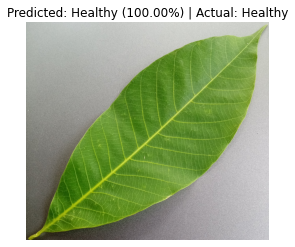

Image: Healthy\IMG_20230323_115417.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


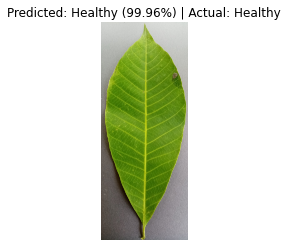

Image: Healthy\IMG_20230323_115640.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.96%


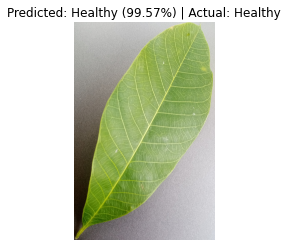

Image: Healthy\IMG_20230323_115747.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.57%


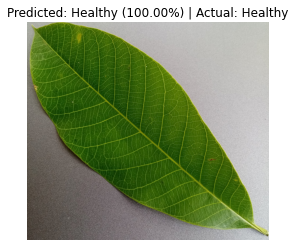

Image: Healthy\IMG_20230323_115754.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


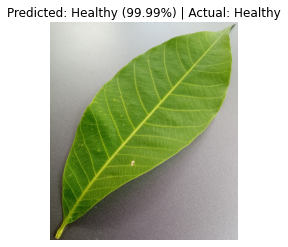

Image: Healthy\IMG_20230323_120037.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.99%


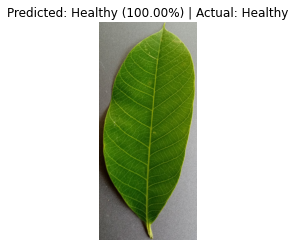

Image: Healthy\IMG_20230323_122429.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


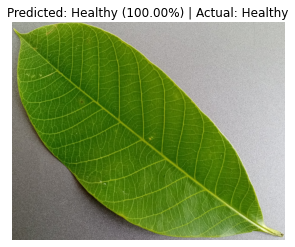

Image: Healthy\IMG_20230323_122434.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


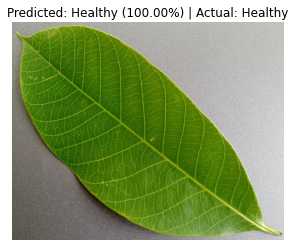

Image: Healthy\IMG_20230323_122436.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


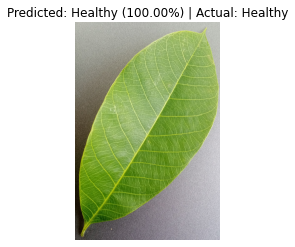

Image: Healthy\IMG_20230323_122447.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


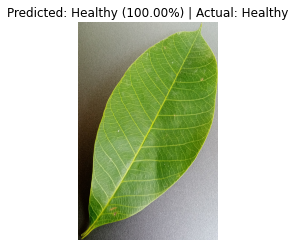

Image: Healthy\IMG_20230323_122602.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


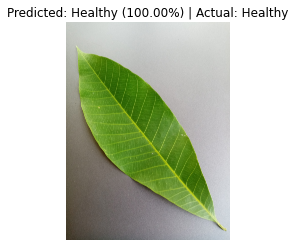

Image: Healthy\IMG_20230323_122639.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


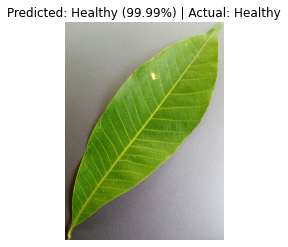

Image: Healthy\IMG_20230323_122902.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.99%


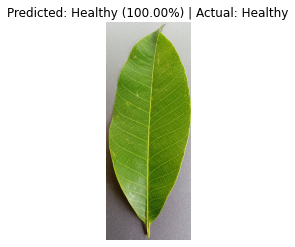

Image: Healthy\IMG_20230323_122946.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


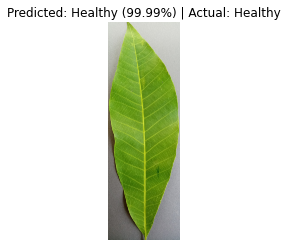

Image: Healthy\IMG_20230323_123422.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.99%


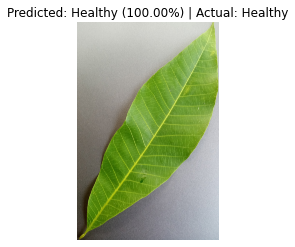

Image: Healthy\IMG_20230323_123429.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


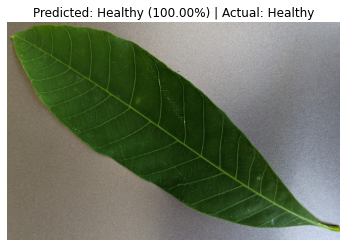

Image: Healthy\PXL_20230729_064146192.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


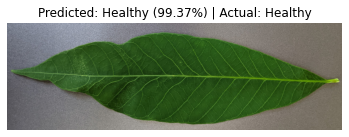

Image: Healthy\PXL_20230729_064206759.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.37%


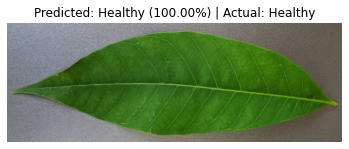

Image: Healthy\PXL_20230729_064339864.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


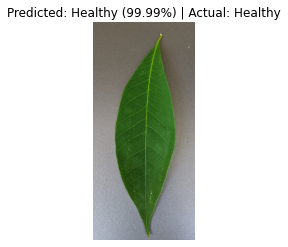

Image: Healthy\PXL_20230729_064632350.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.99%


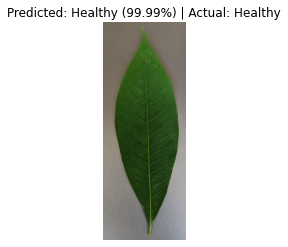

Image: Healthy\PXL_20230729_064736897.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 99.99%


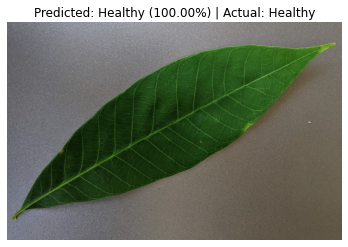

Image: Healthy\PXL_20230729_064800804.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


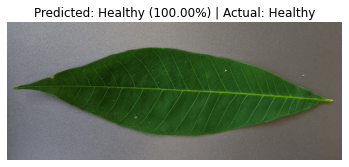

Image: Healthy\PXL_20230729_064816244.jpg | Predicted: Healthy | Actual: Healthy | Confidence: 100.00%


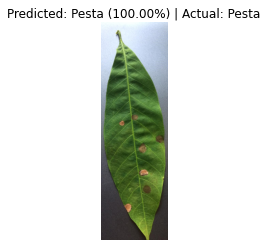

Image: Pesta\WhatsApp Image 2023-04-12 at 11.42.02 AM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 100.00%


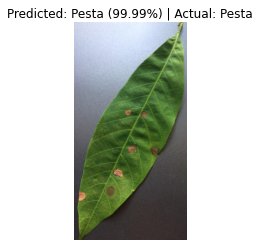

Image: Pesta\WhatsApp Image 2023-04-12 at 11.42.03 AM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 99.99%


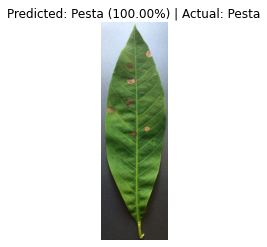

Image: Pesta\WhatsApp Image 2023-04-12 at 11.42.06 AM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 100.00%


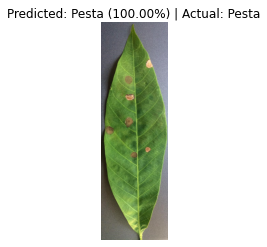

Image: Pesta\WhatsApp Image 2023-04-12 at 11.42.08 AM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 100.00%


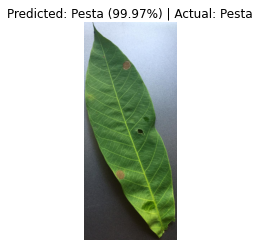

Image: Pesta\WhatsApp Image 2023-04-12 at 11.43.54 AM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 99.97%


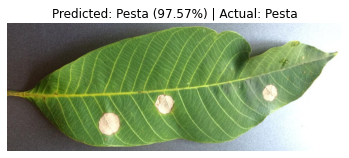

Image: Pesta\WhatsApp Image 2023-04-12 at 11.50.09 AM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 97.57%


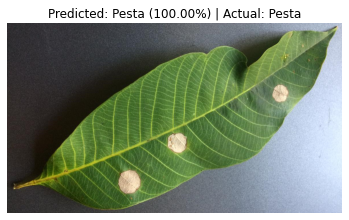

Image: Pesta\WhatsApp Image 2023-04-12 at 11.59.11 AM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 100.00%


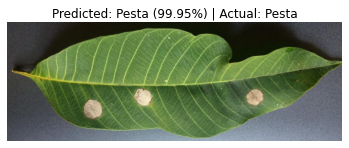

Image: Pesta\WhatsApp Image 2023-04-12 at 11.59.17 AM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 99.95%


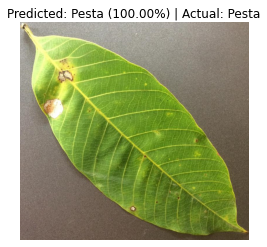

Image: Pesta\WhatsApp Image 2023-04-12 at 11.59.31 AM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 100.00%


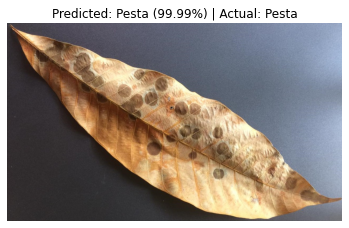

Image: Pesta\WhatsApp Image 2023-04-12 at 12.00.03 PM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 99.99%


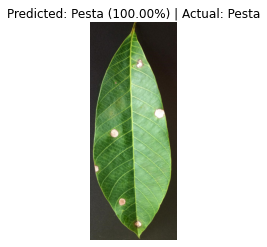

Image: Pesta\WhatsApp Image 2023-04-12 at 12.04.49 PM.jpeg | Predicted: Pesta | Actual: Pesta | Confidence: 100.00%


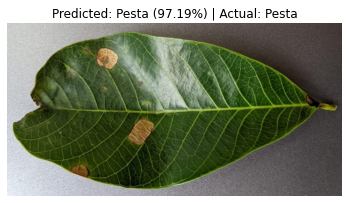

Image: Pesta\q15.jpg | Predicted: Pesta | Actual: Pesta | Confidence: 97.19%


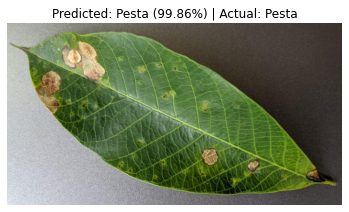

Image: Pesta\q16.jpg | Predicted: Pesta | Actual: Pesta | Confidence: 99.86%


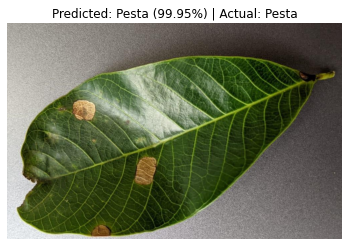

Image: Pesta\q17.jpg | Predicted: Pesta | Actual: Pesta | Confidence: 99.95%


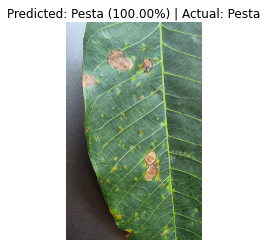

Image: Pesta\x16.jpg | Predicted: Pesta | Actual: Pesta | Confidence: 100.00%


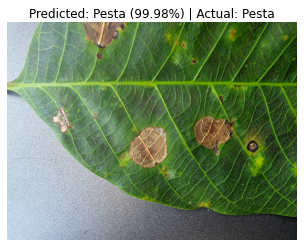

Image: Pesta\x25.jpg | Predicted: Pesta | Actual: Pesta | Confidence: 99.98%


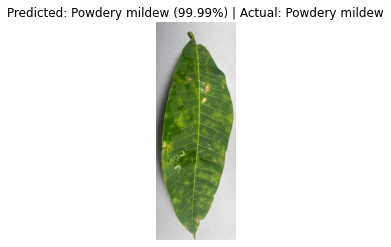

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.35 PM (7).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.99%


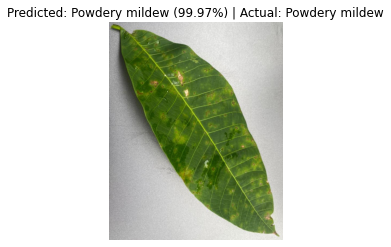

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.35 PM (8).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.97%


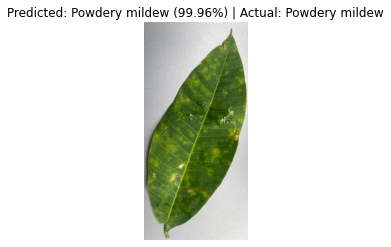

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.35 PM (9).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.96%


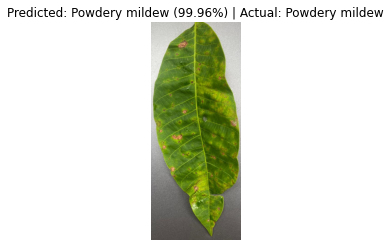

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.36 PM (4).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.96%


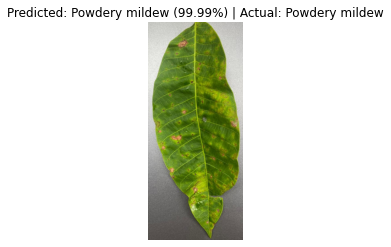

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.36 PM (5).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.99%


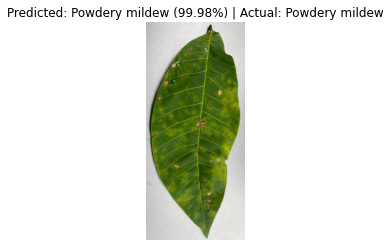

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.36 PM (8).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.98%


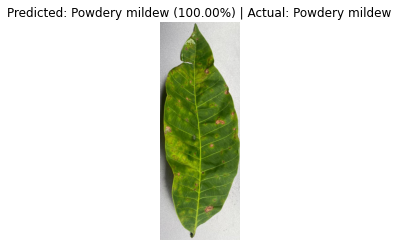

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.11.36 PM.jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 100.00%


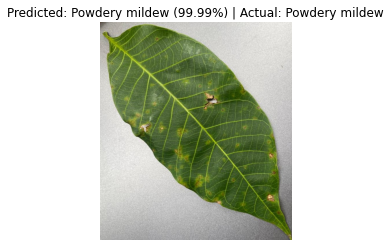

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.13.38 PM (1).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.99%


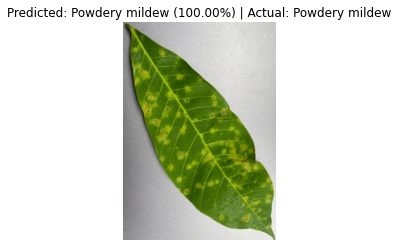

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.13.52 PM (3).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 100.00%


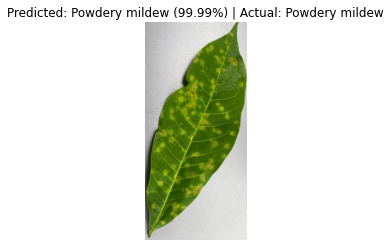

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.13.52 PM (5).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.99%


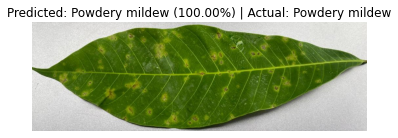

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.22.13 PM (1).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 100.00%


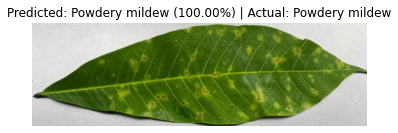

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.22.14 PM (2).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 100.00%


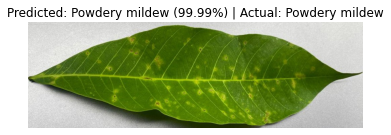

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.22.17 PM.jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.99%


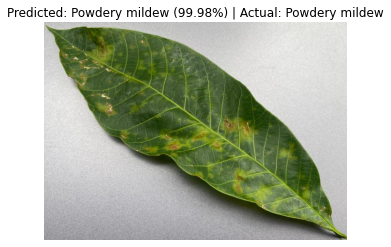

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.39.04 PM (1).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.98%


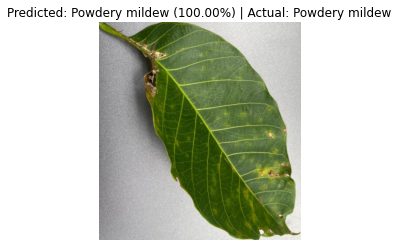

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.40.06 PM (3).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 100.00%


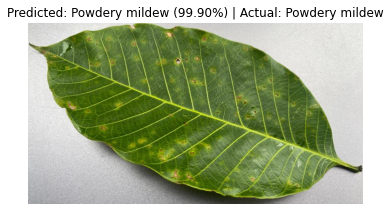

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.40.08 PM (3).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.90%


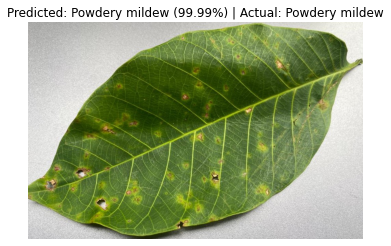

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.42.00 PM (5).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.99%


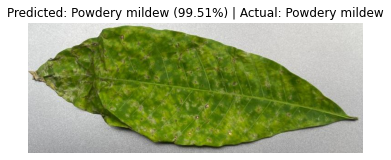

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.42.01 PM (3).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.51%


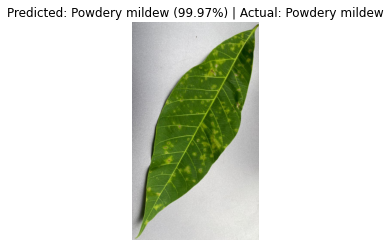

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.43.05 PM (11).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.97%


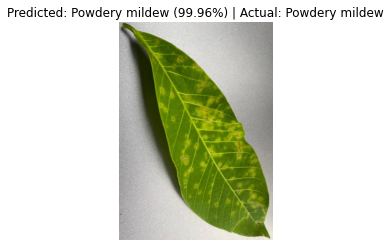

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.43.05 PM (25).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.96%


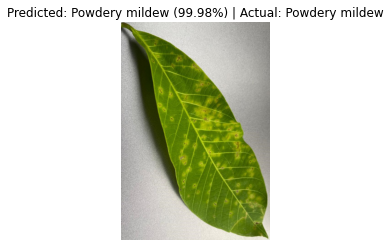

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.43.05 PM (26).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 99.98%


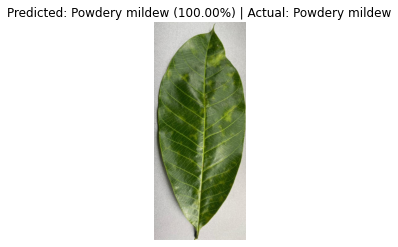

Image: Powdery mildew\WhatsApp Image 2023-03-22 at 4.45.07 PM (7).jpeg | Predicted: Powdery mildew | Actual: Powdery mildew | Confidence: 100.00%


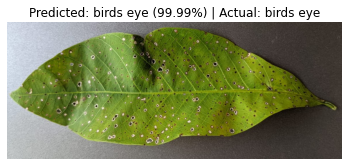

Image: birds eye\WhatsApp Image 2023-04-21 at 8.54.56 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.99%


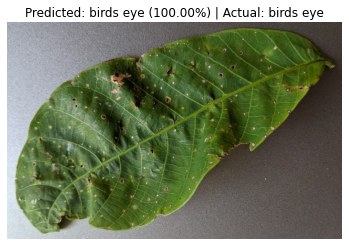

Image: birds eye\WhatsApp Image 2023-04-21 at 9.00.16 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 100.00%


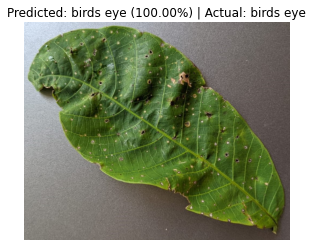

Image: birds eye\WhatsApp Image 2023-04-21 at 9.00.17 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 100.00%


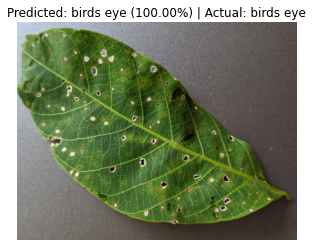

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.20 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 100.00%


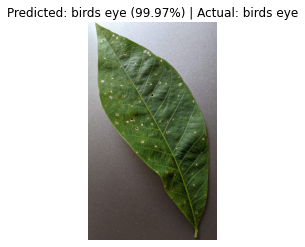

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.21 PM (1).jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.97%


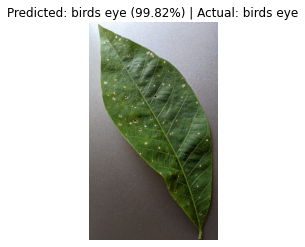

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.22 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.82%


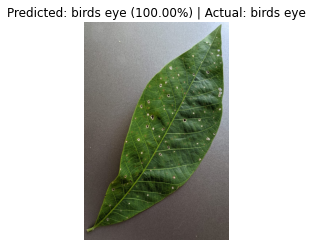

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.23 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 100.00%


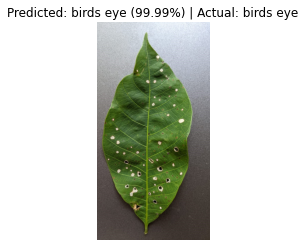

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.27 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.99%


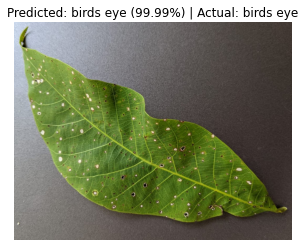

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.38 PM (1).jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.99%


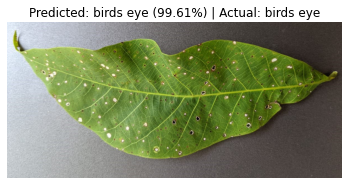

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.39 PM (1).jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.61%


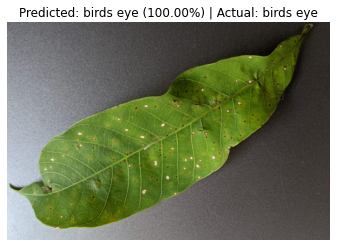

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.40 PM (1).jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 100.00%


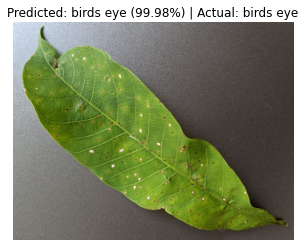

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.41 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.98%


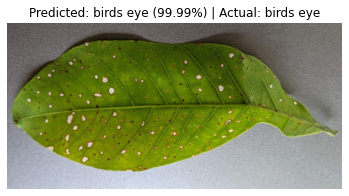

Image: birds eye\WhatsApp Image 2023-04-21 at 9.01.46 PM (1).jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.99%


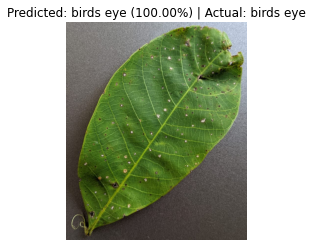

Image: birds eye\WhatsApp Image 2023-04-21 at 9.03.28 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 100.00%


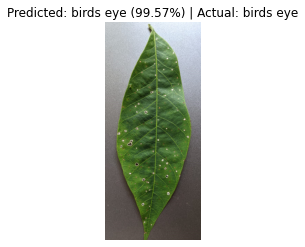

Image: birds eye\WhatsApp Image 2023-04-21 at 9.03.46 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.57%


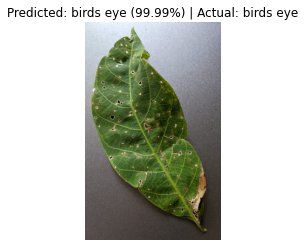

Image: birds eye\WhatsApp Image 2023-04-21 at 9.03.52 PM (1).jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.99%


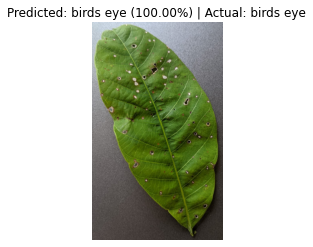

Image: birds eye\WhatsApp Image 2023-04-21 at 9.04.00 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 100.00%


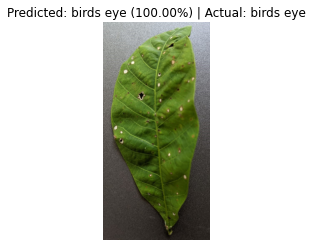

Image: birds eye\WhatsApp Image 2023-04-21 at 9.04.02 PM (1).jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 100.00%


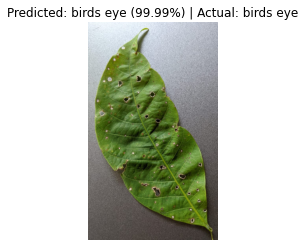

Image: birds eye\WhatsApp Image 2023-04-21 at 9.04.06 PM.jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 99.99%


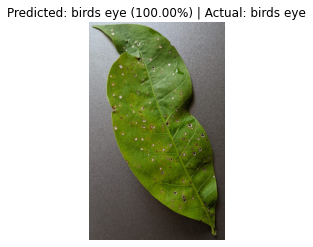

Image: birds eye\WhatsApp Image 2023-04-21 at 9.04.12 PM (1).jpeg | Predicted: birds eye | Actual: birds eye | Confidence: 100.00%


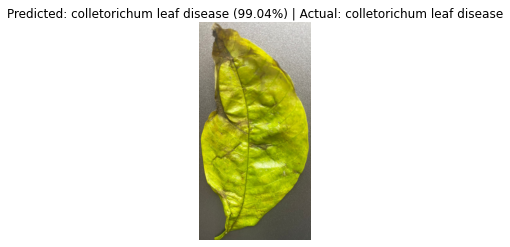

Image: colletorichum leaf disease\IMG-20230322-WA0011.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.04%


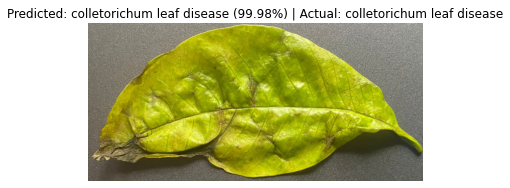

Image: colletorichum leaf disease\IMG-20230322-WA0012(1).jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.98%


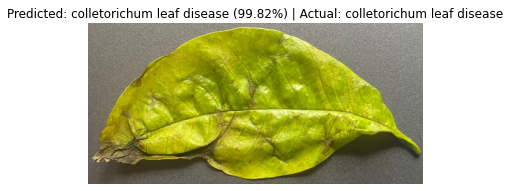

Image: colletorichum leaf disease\IMG-20230322-WA0012.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.82%


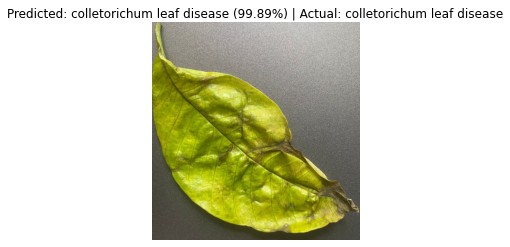

Image: colletorichum leaf disease\IMG-20230322-WA0022.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.89%


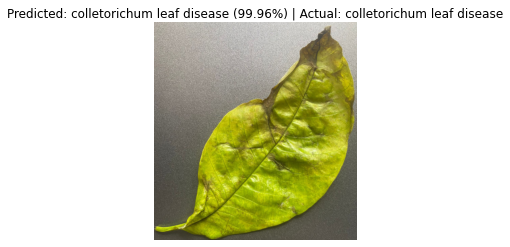

Image: colletorichum leaf disease\IMG-20230322-WA0023.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.96%


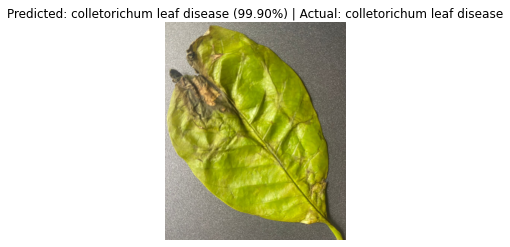

Image: colletorichum leaf disease\IMG-20230322-WA0026.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.90%


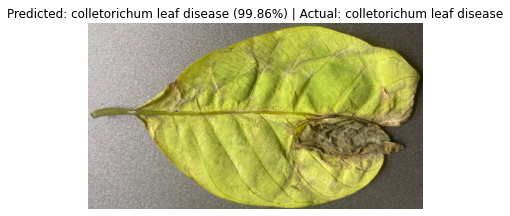

Image: colletorichum leaf disease\IMG-20230322-WA0028.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.86%


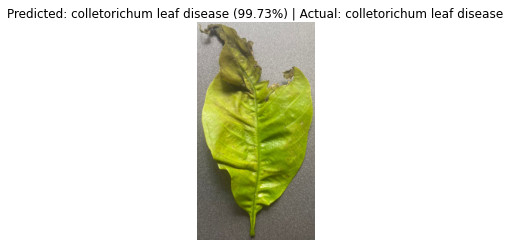

Image: colletorichum leaf disease\IMG-20230322-WA0034.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.73%


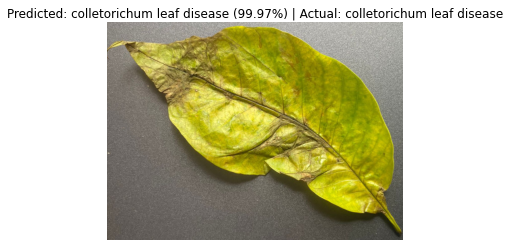

Image: colletorichum leaf disease\IMG-20230322-WA0053.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.97%


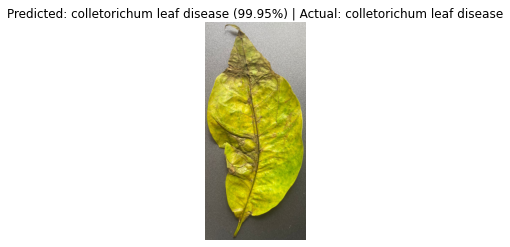

Image: colletorichum leaf disease\IMG-20230322-WA0055.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.95%


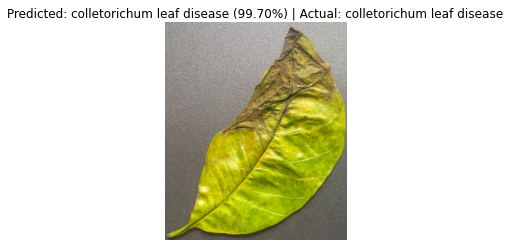

Image: colletorichum leaf disease\IMG-20230322-WA0057.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.70%


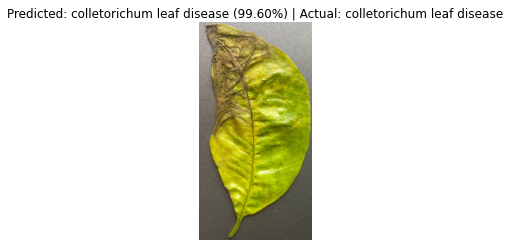

Image: colletorichum leaf disease\IMG-20230322-WA0060.jpg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.60%


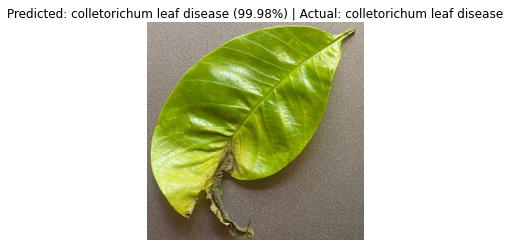

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 1.35.45 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.98%


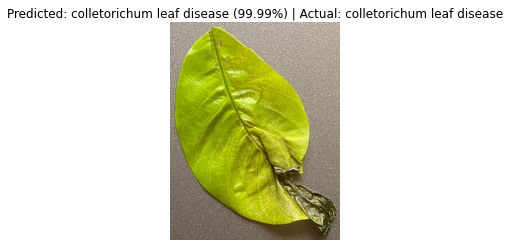

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 1.44.44 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.99%


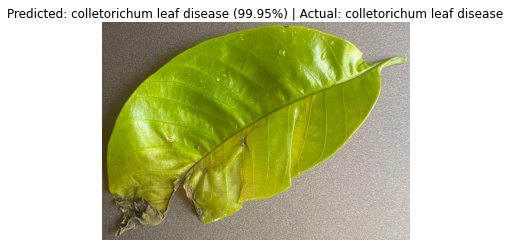

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 1.45.27 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.95%


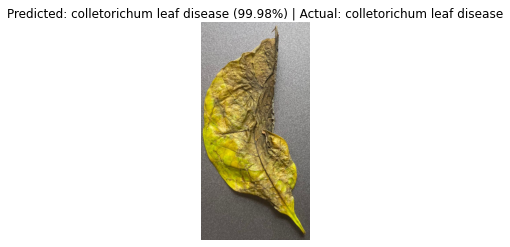

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.33.20 PM (1).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.98%


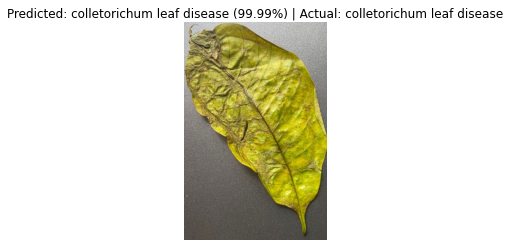

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.33.40 PM (2).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.99%


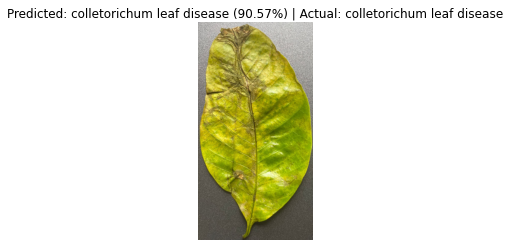

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.33.53 PM (2).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 90.57%


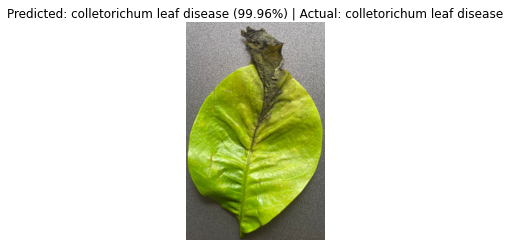

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.34.02 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.96%


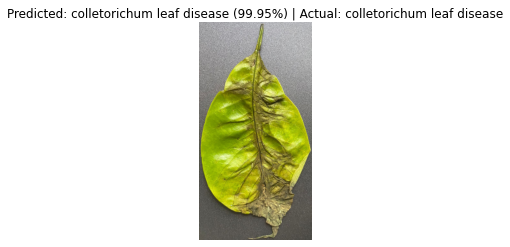

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.34.28 PM.jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.95%


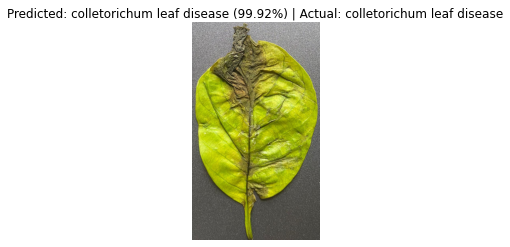

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.34.29 PM (1).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.92%


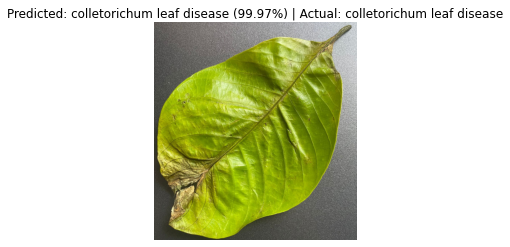

Image: colletorichum leaf disease\WhatsApp Image 2023-03-22 at 12.34.51 PM (2).jpeg | Predicted: colletorichum leaf disease | Actual: colletorichum leaf disease | Confidence: 99.97%


In [25]:
from PIL import Image
import matplotlib.pyplot as plt

# Get predictions from the model
predictions = final_model.predict(test_batches)

# Convert predicted probabilities to class labels
predicted_labels = predictions.argmax(axis=-1)

# Get actual labels from the 'test_batches' object
actual_labels = test_batches.classes

# Get class names from the 'test_batches' object
class_names = list(test_batches.class_indices.keys())

# Iterate through the test batch and display image, predicted label, actual label, and confidence percentage
for i in range(len(test_batches.filenames)):
    image_filename = test_batches.filenames[i]
    predicted_class_name = class_names[predicted_labels[i]]
    actual_class_name = class_names[actual_labels[i]]
    
    # Get the confidence percentage for the predicted class
    confidence_percentage = predictions[i][predicted_labels[i]] * 100.0
    
    # Load and display the image using PIL
    image_path = "C:/Users/User/Desktop/Models(FYP)/mobileNet_Try/dataset/test/" + image_filename  # Replace with the actual path to your test dataset
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f"Predicted: {predicted_class_name} ({confidence_percentage:.2f}%) | Actual: {actual_class_name}")
    plt.axis('off')
    plt.show()
    
    print(f"Image: {image_filename} | Predicted: {predicted_class_name} | Actual: {actual_class_name} | Confidence: {confidence_percentage:.2f}%")


In [26]:
import os.path
final_model.save('V2.0.h5')

C:\Users\User\AppData\Roaming\Python\Python39\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [27]:
converter = tf.lite.TFLiteConverter.from_keras_model(final_model)
tflite_model = converter.convert()

# Define the complete path and filename for saving the model
tflite_model_path = "C:/Users/User/Desktop/Models(FYP)/mobileNet_Try/TenserflowLite/final_modelV2.tflite"

# Save the TensorFlow Lite model to the specified location
with open(tflite_model_path, 'wb') as f:
    f.write(tflite_model)

print(f"TensorFlow Lite model saved at: {tflite_model_path}")

INFO:tensorflow:Assets written to: C:\Users\User\AppData\Local\Temp\tmpwefcehvt\assets


INFO:tensorflow:Assets written to: C:\Users\User\AppData\Local\Temp\tmpwefcehvt\assets


TensorFlow Lite model saved at: C:/Users/User/Desktop/Models(FYP)/mobileNet_Try/TenserflowLite/final_modelV2.tflite


In [23]:

test_dds = 'DiffTest'

In [38]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

img = image.load_img("C:/Users/User/Desktop/Models(FYP)/mobileNet_Try/DiffTest/other/UNADJUSTEDNONRAW_thumb_1.jpg", target_size=(224, 224))
img = image.img_to_array(img)
img = preprocess_input(img)


In [39]:
predictions = final_model.predict(img.reshape(1, 224, 224, 3))

1/1 [==============================] - 1s 1s/step


In [40]:
predicted_class = predictions.argmax()

In [41]:
predictions

array([[0.0398068 , 0.2786973 , 0.08167369, 0.45352402, 0.05293381,
        0.09336432]], dtype=float32)

In [8]:
test_batches.class_indices

{'Corynespora': 0,
 'Healthy': 1,
 'Pesta': 2,
 'Powdery mildew': 3,
 'birds eye': 4,
 'colletorichum leaf disease': 5}

In [13]:
valid_batches.class_indices

{'Corynespora': 0,
 'Healthy': 1,
 'Pesta': 2,
 'Powdery mildew': 3,
 'birds eye': 4,
 'colletorichum leaf disease': 5}

In [14]:
train_ds.class_indices

AttributeError: 'str' object has no attribute 'class_indices'